In [16]:
# lancer
!pip install lightning

# Gestion mémoire Kaggle

In [53]:
# suppression repertoire log pour libérer de la place
import shutil
shutil.rmtree('/kaggle/working/logs')
# os.remove('/kaggle/working/deepcnn2_visualization.png')

In [32]:
# Cellule de code dans un notebook Kaggle
!rm -rf /kaggle/working/detected_faces/val/others

In [19]:
!rm -rf /root/.cache/uv

In [17]:
!rm -rf /root/.cache/*

In [3]:
!rm /kaggle/working/checkpoints/*

In [2]:
!ls -lha /kaggle/working/*


-rw-r--r--  1 root root 319M Apr 29 11:00 /kaggle/working/best_best_model.ckpt
-rw-r--r--  1 root root 319M Apr 29 11:00 /kaggle/working/best_model_ConvNext.ckpt
-rw-r--r--  1 root root 749M Apr 29 11:00 /kaggle/working/convnext_model.pth
-rw-r--r--  1 root root 405M Apr 29 11:00 /kaggle/working/state.db
-rw-r--r--  1 root root 6.3M Apr 29 11:01 /kaggle/working/yolov8n.pt

/kaggle/working/checkpoints:
total 15G
drwxr-xr-x 2 root root 4.0K Apr 29 11:00  .
drwxr-xr-x 7 root root 4.0K Apr 29 11:01  ..
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=01-val_acc=0.50.ckpt'
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=07-val_acc=0.51.ckpt'
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=07-val_acc=0.53.ckpt'
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=12-val_acc=0.48.ckpt'
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=17-val_acc=0.52.ckpt'
-rw-r--r-- 1 root root 1.2G Apr 29 11:01 'best_model-epoch=25-val_acc=0.57.ckpt'
-rw-r--r--

In [21]:
# vérification si GPU 
print("GPU disponible:", torch.cuda.is_available())
print("Nom du GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "Pas de GPU")

GPU disponible: True
Nom du GPU: Tesla P100-PCIE-16GB


# Fonction visualisation des images

In [142]:
# Fonction de visualisation

import os
import cv2
import matplotlib.pyplot as plt
import math

def visualize_images(image_dir, num_images=16):
    """
    Visualise les images présentes dans un répertoire sous forme de grille
    avec un numéro au-dessus de chaque image et affiche après utilisation la liste
    des correspondances entre les numéros et les noms des fichiers.

    Args:
        image_dir (str): Chemin du répertoire contenant les images à afficher.
        num_images (int): Nombre maximum d'images à afficher.
    """
    # Liste des fichiers images dans le répertoire
    image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
    image_files = image_files[:num_images]  # Limiter la sélection au nombre d'images demandées

    # Fixer à 7 le nombre de colonnes et calculer les lignes nécessaires
    num_cols = 7
    num_rows = math.ceil(len(image_files) / num_cols)  # Calculer dynamiquement les lignes nécessaires

    # Ajuster la taille de la figure en fonction du nombre de colonnes et de lignes
    figure_width = 20  # Largeur totale pour 7 colonnes
    figure_height = 3 * num_rows  # Hauteur, avec 3 unités par ligne (ajuster si nécessaire)
    plt.figure(figsize=(figure_width, figure_height))  # Redimensionner la figure pour remplir l'espace

    for i, img_name in enumerate(image_files):
        img_path = os.path.join(image_dir, img_name)
        img = cv2.imread(img_path)
        if img is None:
            continue  # Ignorer les fichiers non traitables
        
        # Convertir l'image en RGB pour qu'elle soit compatible avec Matplotlib
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Ajouter l'image à la bonne position dans la grille
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')  # Supprime les axes pour une meilleure esthétique
        
        # Afficher le numéro de l'image au-dessus
        plt.title(f"{i + 1}", fontsize=12, color='blue', pad=10)  # Augmenter légèrement la taille des titres

    # Ajouter un titre global pour clarifier l'objectif
    plt.suptitle("Visualisation d'images (7 colonnes)", fontsize=18, color="black")
    plt.tight_layout()  # Réduire les marges entre les sous-graphiques
    plt.subplots_adjust(top=0.92)  # Ajuster l'espace du titre global (éviter écrasement des images)
    plt.show()

    # Affichage des correspondances entre numéros et noms des fichiers
    print("\nCorrespondances entre les numéros et noms des fichiers :")
    for i, img_name in enumerate(image_files):
        print(f"Image {i + 1}: {img_name}")  # Affiche 'Image X: nom_du_fichier'


In [ ]:
# Visualisation répertoire train keira
visualize_images("/kaggle/input/deeppics/train/keira", num_images=7)

# CNN "fait à la main" 5 blocs  

## Datamodule CNN_base

In [18]:
# Datamodule CNN_base

import pytorch_lightning as pl
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

class ImageDataModule_CNN_base(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=32):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size

        self.train_transform = transforms.Compose([
            #transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
            transforms.RandomAffine(degrees=10, scale=(0.8, 1.1), shear=10, fill=0),  # Zoom In/Out sans changer la taille finale
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(10),
            transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.02),
            transforms.GaussianBlur(1),  
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            transforms.RandomErasing(p=0.3, scale=(0.02, 0.1))  
        ])
        
        self.val_test_transform = transforms.Compose([
            # transforms.Resize(224),  # Redimensionne le plus petit côté à 224 
            # transforms.CenterCrop(224),  # Recadre pour obtenir un carré 224 × 224 sans déformer
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
       
    def setup(self, stage=None):
        self.train_dataset = ImageFolder(root=f"{self.data_dir}/train", transform=self.train_transform)
        self.val_dataset = ImageFolder(root=f"{self.data_dir}/val", transform=self.val_test_transform)
        self.test_dataset = ImageFolder(root=f"{self.data_dir}/test", transform=self.val_test_transform)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=4, pin_memory=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)

# Création de l'instance du DataModule
data_module_CNN_base = ImageDataModule_CNN_base(data_dir="/kaggle/input/deeppics", batch_size=32)
data_module_CNN_base.setup()

## Définition modèle CNN_base

In [24]:
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim.lr_scheduler import OneCycleLR
from torchmetrics import Accuracy
from pytorch_lightning.callbacks import EarlyStopping, Callback, ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger

class CNN_base_5_blocs(pl.LightningModule):
    def __init__(self, num_classes=3, learning_rate=5e-4, weight_decay=1e-3, scheduler_max_lr=1e-4):
        super(CNN_base_5_blocs, self).__init__()
        self.learning_rate = learning_rate    # pour l'optimiseur AdamW
        self.weight_decay = weight_decay      # pour AdamW
        self.scheduler_max_lr = scheduler_max_lr  # pour le OneCycleLR 
        self.conv_layers = nn.Sequential(
            # Bloc 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            # nn.Dropout2d(0.2),  # Ajout dropout 
        
            # Bloc 2
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            #nn.Dropout2d(0.10),  # Ajout dropout 
        
            # Bloc 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            # nn.Dropout2d(0.1),   # Ajout dropout 
        
            # Bloc 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout2d(0.1), 
        
            # Bloc 5 
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout2d(0.2),   
        )
        # Passez un tenseur fictif pour calculer la taille de sortie
        #sample_input = torch.zeros(1, 3, 224, 224)  # pour images 224x224
        sample_input = torch.zeros(1, 3, 530, 400)  # Adapté à 530x400
        output = self.conv_layers(sample_input)
        flattened_size = output.numel()  # Taille totale après aplatissage
       
        self.fc = nn.Sequential(
            nn.Linear(flattened_size, 1024),  
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, num_classes)
        )

    # Initialiser la métrique de précision
        self.train_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.val_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.test_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        
    def forward(self, x):
        x = self.conv_layers(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

    def training_step(self, batch, batch_idx):
        """Une étape d'entraînement : calcul des prédictions, de la perte et retour de la perte."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.train_accuracy(y_hat, y)  
        self.log("train_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        """Une étape de validation : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.val_accuracy(y_hat, y)
        self.log("val_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        """Une étape de test : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.test_accuracy(y_hat, y)
        self.log("test_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def configure_optimizers(self):
        """
        Configurer l'optimiseur et le scheduler.
        Toutes les couches dégelées seront optimisées.
        """
        # Créer l'optimiseur : inclure toutes les couches dégelées uniquement
        optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, self.parameters()),  # Inclure uniquement les paramètres dégelés
            lr=self.learning_rate,  
            weight_decay=self.weight_decay # Régularisation L2
        )
        
        # Scheduler toggle
        use_scheduler = False
    
        if use_scheduler:
            # Calcul du nombre d'étapes par epoch à partir du DataLoader
            if self.trainer and self.trainer.datamodule:
                train_loader = self.trainer.datamodule.train_dataloader()
                steps_per_epoch = len(train_loader)
            else:
                steps_per_epoch = 100  # Valeur par défaut si le DataLoader n'est pas défini
                print("⚠️ Warning : 'trainer' ou 'datamodule' non défini, steps_per_epoch par défaut utilisé.")
            
            # Scheduler OneCycleLR
            scheduler = optim.lr_scheduler.OneCycleLR(
                optimizer,
                max_lr=self.scheduler_max_lr,  # Taux d'apprentissage maximal
                steps_per_epoch=steps_per_epoch,
                epochs=self.trainer.max_epochs if self.trainer else 10
            )
            
            # Retourner l'optimiseur et le scheduler
            return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "interval": "step"}}
        else:
            # Retourner uniquement l'optimiseur si le scheduler est désactivé
            return {"optimizer": optimizer}

checkpoint_callback = ModelCheckpoint(
    monitor="val_acc",
    mode="max",
    save_top_k=1,  # Sauvegarde uniquement le meilleur modèle
    dirpath="checkpoints/",  # Dossier pour enregistrer les checkpoints
    filename="best_model-{epoch:02d}-{val_acc:.2f}"
)

# Initialisation du Modèle
#model_CNN_base = CNN_base_5_blocs(num_classes=3, learning_rate=5e-6, weight_decay=0.2, scheduler_max_lr=2e-5)  
model_CNN_base = CNN_base_5_blocs(num_classes=3, learning_rate=5e-04, weight_decay=0.1, scheduler_max_lr=8e-4)  

# Logger pour enregistrer les métriques dans un fichier CSV
csv_logger = CSVLogger(save_dir="logs", name="my_experiment", version="CNN_base_5_blocs")

## Calcul learning rate CNN_base avec Tuner

In [23]:
import pytorch_lightning as pl
from lightning.pytorch.tuner import Tuner

# 1. Définir le modèle et le trainer
model = CNN_base_5_blocs(num_classes=3)
trainer = pl.Trainer(max_epochs=3, accelerator="auto")

# 2. Mettre tout dans un même bloc try-except
try:
    lr_finder = Tuner(trainer).lr_find(
        model,
        datamodule=data_module_CNN_base
    )
    
    # 3. IMMÉDIATEMENT sauvegarder le résultat avant toute exception
    best_lr = lr_finder.suggestion()
    print(f"Best LR found: {best_lr}")
    
    # Optionnel : plot (peut causer des problèmes sur Kaggle)
    import matplotlib.pyplot as plt
    fig = lr_finder.plot(suggest=True)
    fig.show()
    
except Exception as e:
    print(f"Exception caught: {type(e).__name__}")
    if 'best_lr' in locals():
        print(f"Managed to extract best LR: {best_lr}")
    else:
        print("Failed to extract LR. Trying fallback:")
        # Astuce Kaggle : souvent le LR est dans les logs
        import re
        logs = !cat /kaggle/working/lr_find.log  # Essaye de lire les logs
        found_lr = re.search(r"Learning rate set to (\d+\.?\d*e?-?\d+)", "\n".join(logs))
        if found_lr:
            print(f"Fallback LR from logs: {found_lr.group(1)}")
            best_lr = float(found_lr.group(1))
        else:
            best_lr = 5e-4  # Valeur par défaut raisonnable
            print(f"Using default LR: {best_lr}")


INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (14) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=3` reached.
INFO: LR finder stopped early after 42 steps due to diverging loss.
INFO: Learning rate set to 5.248074602497728e-06
INFO: Restoring states from the checkpoint path at /kaggle/working/.lr_find_34325c4a-a29a-47a3-a5e9-10e6d4369e5f.ckpt
INFO: Restored all states from the checkpoint at /kaggle/working/.lr_find_34325c4a-a29a-47a3-a5e9-10e6d4369e5f.ckpt


Exception caught: _TunerExitException
Managed to extract best LR: 0.0005


## Trainer CNN_base 

In [50]:
## trainer CNN_base

from pytorch_lightning import Trainer

# Entraînement du Modèle
trainer = Trainer(
    max_epochs=100,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    precision="16-mixed",
    logger=csv_logger,
    callbacks=[checkpoint_callback],
    enable_progress_bar=True,
    enable_model_summary=True,
    check_val_every_n_epoch=1,
    val_check_interval=1.0
)

# Entraîner le modèle
trainer.fit(model_CNN_base, datamodule=data_module_CNN_base)

# Tester le modèle
trainer.test(model_CNN_base, datamodule=data_module_CNN_base)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6071428656578064     │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.6071428656578064}]

## Log CNN_base

In [44]:
## Affichage log CNN_base
import pandas as pd
from tabulate import tabulate

# Chemin vers le fichier CSV
log_path = "logs/my_experiment/CNN_base_5_blocs/metrics.csv"

# Lire le fichier CSV
df = pd.read_csv(log_path)

# Afficher le tableau
df.style.format("{:.2f}")  # Pour formater les nombres

,epoch,step,test_acc,train_acc,val_acc
0,0.00,13.00,nan,nan,0.35
1,0.00,13.00,nan,0.38,nan
2,1.00,27.00,nan,nan,0.32
3,1.00,27.00,nan,0.34,nan
4,2.00,41.00,nan,nan,0.33
5,2.00,41.00,nan,0.34,nan
6,3.00,55.00,nan,nan,0.40
7,3.00,55.00,nan,0.36,nan
8,4.00,69.00,nan,nan,0.35
9,4.00,69.00,nan,0.32,nan


## Sauvegarde CNN_base

In [47]:
# Après l'entraînement :
torch.save(model_CNN_base.state_dict(), "/kaggle/working/last_CNN_base_5_blocs.pth")


In [48]:
# Charge les poids sauvegardés
model_CNN_base.load_state_dict(torch.load("/kaggle/working/last_CNN_base_5_blocs.pth"))

# test du modèle chargé
trainer.test(model_CNN_base, datamodule=data_module_CNN_base)

<ipython-input-48-ff0ec974d1a5>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_CNN_base.load_state_dict(torch.load("/kaggle/working/last_CNN_base_5_blocs.pth"))


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6607142686843872     │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.6607142686843872}]

# Modèle ConvNext

In [25]:
!pip install timm

In [12]:
# info
import timm
all_models = timm.list_models(filter='convnext*')
print(all_models)

['convnext_atto', 'convnext_atto_ols', 'convnext_atto_rms', 'convnext_base', 'convnext_femto', 'convnext_femto_ols', 'convnext_large', 'convnext_large_mlp', 'convnext_nano', 'convnext_nano_ols', 'convnext_pico', 'convnext_pico_ols', 'convnext_small', 'convnext_tiny', 'convnext_tiny_hnf', 'convnext_xlarge', 'convnext_xxlarge', 'convnext_zepto_rms', 'convnext_zepto_rms_ols', 'convnextv2_atto', 'convnextv2_base', 'convnextv2_femto', 'convnextv2_huge', 'convnextv2_large', 'convnextv2_nano', 'convnextv2_pico', 'convnextv2_small', 'convnextv2_tiny']


## Datamodule pour modèle ConvNext

In [2]:
import pytorch_lightning as pl
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

class ImageDataModule_ConvNext(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=32):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size

        self.train_transform = transforms.Compose([
            #transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(10),
            transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.02),
            transforms.GaussianBlur(1),  
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            transforms.RandomErasing(p=0.3, scale=(0.02, 0.1))  # Légèrement plus agressif mais réglable
])
        
        self.val_test_transform = transforms.Compose([
            #transforms.Resize(224),  # Redimensionne le plus petit côté à 224 (deviendrait 297 × 224)
            #transforms.CenterCrop(224),  # Recadre pour obtenir un carré 224 × 224 sans déformer
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def setup(self, stage=None):
        self.train_dataset = ImageFolder(root=f"{self.data_dir}/train", transform=self.train_transform)
        self.val_dataset = ImageFolder(root=f"{self.data_dir}/val", transform=self.val_test_transform)
        self.test_dataset = ImageFolder(root=f"{self.data_dir}/test", transform=self.val_test_transform)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=4, pin_memory=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)

# Création de l'instance du DataModule
data_module_ConvNext = ImageDataModule_ConvNext(data_dir="/kaggle/input/deeppics", batch_size=32)
data_module_ConvNext.setup()


## Définition modèle ConvNext

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR
import timm
import pytorch_lightning as pl
from torchmetrics.classification import Accuracy
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

class ConvNeXtModel(pl.LightningModule):
    def __init__(self, num_classes=3):
        """
        Classifier personnalisé basé sur ConvNeXt Large avec extraction de features.
        Args:
            num_classes: Nombre de classes pour la classification (ici 3).
        """
        super(ConvNeXtModel, self).__init__()

        # Charger ConvNeXt Large pré-entraîné
        self.convnext = timm.create_model(
            'convnext_tiny.in12k_ft_in1k_384',  
            # 'convnextv2_tiny.fcmae_ft_in22k_in1k_384',
            #'convnext_small.in12k_ft_in1k_384',
            #'convnext_large.fb_in22k_ft_in1k_384', 
            #'convnextv2_base.fcmae_ft_in22k_in1k_384',
            
            num_classes=num_classes, 
            pretrained=True
        )

        # déggeler toutes les couches du modèle (Feature Extraction)
        for param in self.convnext.parameters():
            param.requires_grad = True

        # Ajouter Dropout après chaque stage
        self.convnext.stages[0] = nn.Sequential(
            self.convnext.stages[0],
            #nn.Dropout(0.1)
        )
        self.convnext.stages[1] = nn.Sequential(
            self.convnext.stages[1],
            #nn.Dropout(0.1)
        )
        self.convnext.stages[2] = nn.Sequential(
            self.convnext.stages[2],
            #nn.Dropout(0.2)
        )
        self.convnext.stages[3] = nn.Sequential(
            self.convnext.stages[3],
            #nn.Dropout(0.3)
        )
        
        # Remplacer la dernière couche (head) par un classifieur adapté à num_classes
        #self.convnext.head = nn.Linear(self.convnext.num_features, num_classes)
        self.convnext.head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),  # Pooling pour réduire les dimensions (spatial -> 1x1)
            nn.Flatten(),  # Aplatir pour passer à un vecteur
            #nn.Dropout(p=0.5),  # Dropout pour réduire l'overfitting (probabilité = 0.5)
            nn.Linear(self.convnext.num_features, num_classes)
        )

        # Initialiser des métriques de précision
        self.train_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.val_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.test_accuracy = Accuracy(task="multiclass", num_classes=num_classes)

    def forward(self, x):
        """Passage avant (forward) de l'image dans le modèle."""
        return self.convnext(x)

    def training_step(self, batch, batch_idx):
        """Une étape d'entraînement : calcul des prédictions, de la perte et retour de la perte."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.train_accuracy(y_hat, y)  # Précision
        self.log("train_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        """Une étape de validation : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.val_accuracy(y_hat, y)
        self.log("val_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        """Une étape de test : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.test_accuracy(y_hat, y)
        self.log("test_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def configure_optimizers(self):
        """
        Configurer l'optimiseur et le scheduler.
        Toutes les couches dégelées seront optimisées.
        """
        # optimiseur 
        optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, self.parameters()),  # Inclure uniquement les paramètres dégelés
            lr=1e-5,  # Taux d'apprentissage initial
            weight_decay=1e-3  # Régularisation pour éviter l'overfitting
        )
        
        # Scheduler toggle
        use_scheduler = True  
    
        if use_scheduler:
            # Calcul du nombre d'étapes par epoch à partir du DataLoader
            if self.trainer and self.trainer.datamodule:
                train_loader = self.trainer.datamodule.train_dataloader()
                steps_per_epoch = len(train_loader)
            else:
                steps_per_epoch = 100  # Valeur par défaut si le DataLoader n'est pas défini
                print("⚠️ Warning : 'trainer' ou 'datamodule' non défini, steps_per_epoch par défaut utilisé.")
            
            # Scheduler OneCycleLR
            scheduler = optim.lr_scheduler.OneCycleLR(
                optimizer,
                max_lr=1e-4,  # Taux d'apprentissage maximal
                steps_per_epoch=steps_per_epoch,
                epochs=self.trainer.max_epochs if self.trainer else 10
            )
            
            # Retourner l'optimiseur et le scheduler
            return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "interval": "step"}}
        else:
            # Retourner uniquement l'optimiseur si le scheduler est désactivé
            return {"optimizer": optimizer}

# Logger pour enregistrer les métriques
csv_logger = CSVLogger(
    save_dir="logs",
    name="ConvNeXtModel",
    version="ConvNeXtModel_head_unfreezed"
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_acc",
    mode="max",
    save_top_k=1,  # Sauvegarde uniquement le meilleur modèle
    dirpath="checkpoints/",  # Dossier pour enregistrer les checkpoints
    filename="best_model-{epoch:02d}-{val_acc:.2f}"
)

# Initialiser le modèle
model_ConvNeXtModel = ConvNeXtModel(num_classes=3)


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

## Trainer modèle ConvNext

In [11]:
from pytorch_lightning import Trainer

torch.cuda.empty_cache()
# Configurer le Trainer avec callbacks
trainer = Trainer(
    max_epochs=20,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    precision="16-mixed",
    logger=csv_logger,
    callbacks=[checkpoint_callback],
    enable_progress_bar=True,
    enable_model_summary=True,
    check_val_every_n_epoch=1,
    val_check_interval=1.0
)

# Entraîner le modèle
trainer.fit(model_ConvNeXtModel, datamodule=data_module_ConvNext)

# Tester le modèle
trainer.test(model_ConvNeXtModel, datamodule=data_module_ConvNext)

In [17]:
best_model_ConvNext = ConvNeXtModel.load_from_checkpoint(checkpoint_callback.best_model_path)

trainer.test(best_model_ConvNext, datamodule=data_module_ConvNext)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.851190447807312     │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.851190447807312}]

 ## Log modèle ConvNext

In [18]:
import pandas as pd
from tabulate import tabulate

# Chemin vers le fichier CSV
log_path = "logs/ConvNeXtModel/ConvNeXtModel_head_unfreezed/metrics.csv"

# Lire le fichier CSV
df = pd.read_csv(log_path)

# Afficher les premières lignes
df.style.format("{:.2f}")  # Pour formater les nombres

,epoch,step,test_acc,train_acc,val_acc
0,0.00,13.00,nan,nan,0.45
1,0.00,13.00,nan,0.37,nan
2,1.00,27.00,nan,nan,0.57
3,1.00,27.00,nan,0.59,nan
4,2.00,41.00,nan,nan,0.58
5,2.00,41.00,nan,0.75,nan
6,3.00,55.00,nan,nan,0.66
7,3.00,55.00,nan,0.80,nan
8,4.00,69.00,nan,nan,0.76
9,4.00,69.00,nan,0.83,nan


## Sauvegarde modèle ConvNext

In [19]:
# Sauvegarde meilleur modèle
import shutil
shutil.copy(checkpoint_callback.best_model_path, "/kaggle/working/best_model_ConvNext.ckpt")

'/kaggle/working/best_model_ConvNext.ckpt'

In [12]:
from pytorch_lightning import Trainer

# Importer meilleur modèle
best_model_ConvNext_copy = ConvNeXtModel.load_from_checkpoint("/kaggle/working/best_model_ConvNext.ckpt")
trainer.test(best_model_ConvNext_copy, datamodule=data_module_ConvNext)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.851190447807312     │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.851190447807312}]

# Modèle ConvNext avec YOLO pour détection des images

In [135]:
!pip install supervision
!pip install ultralytics
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117  # PyTorch (vérifier compatibilité CUDA)
!pip install opencv-python opencv-python-headless  # OpenCV
!pip install thop  # Analyse des modèles
!pip install matplotlib  # Visualisation
!pip install PyYAML  # Gestion des fichiers YAML

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 984.2/984.2 kB 41.8 MB/s eta 0:00:00
Looking in indexes: https://download.pytorch.org/whl/cu117


## Fonction détection des visages

In [137]:
from huggingface_hub import hf_hub_download
from ultralytics import YOLO
from supervision import Detections
from PIL import Image
import os
import cv2
import numpy as np

# Télécharger le modèle YOLOv8 pré-entraîné depuis HuggingFace
model_path = hf_hub_download(repo_id="arnabdhar/YOLOv8-Face-Detection", filename="model.pt")
model = YOLO(model_path)  # Charger YOLOv8-Face

# Fonction pour détecter et sauvegarder le visage basé sur un score combiné centre, probabilité et surface
def detect_best_face_and_crop(image_path, output_dir, prob_weight=0.5, area_weight=0.3, center_weight=0.2):
    """
    Sélectionne le meilleur visage dans une image en combinant les critères :
    - Probabilité (confiance du modèle YOLO).
    - Taille (surface de la bounding box).
    - Distance au centre de l'image.

    L'image du visage sélectionné est sauvegardée dans le répertoire de sortie.

    Args:
        image_path (str): Chemin de l'image d'entrée.
        output_dir (str): Répertoire de sortie pour sauvegarder l'image détectée.
        prob_weight (float): Poids pour la probabilité.
        area_weight (float): Poids pour la surface de la bounding box.
        center_weight (float): Poids pour la distance au centre (inversement pris en compte).
    """

    print(f"Traitement de l'image : {image_path}")
    
    # Charger l'image avec PIL
    image = Image.open(image_path).convert("RGB")
    outputs = model(image)                # Faire une prédiction avec YOLOv8
    results = Detections.from_ultralytics(outputs[0])  # Convertir au format Supervision Detections

    # Si aucune détection n'est effectuée
    if len(results.xyxy) == 0:
        print(f"Pas de visage détecté pour l'image : {image_path}")
        return

    # Charger l'image au format numpy pour le traitement avec OpenCV
    numpy_image = np.array(image)
    original_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
    img_h, img_w = original_image.shape[:2]  # Dimensions de l'image

    # Centre de l'image
    image_center = (img_w / 2, img_h / 2)  # (x_c, y_c)

    # Calcul des scores pour chaque visage détecté
    scores = []  # Liste des scores combinés
    for bbox, conf in zip(results.xyxy, results.confidence):
        # Extraire les coordonnées de la bounding box
        x_min, y_min, x_max, y_max = map(int, bbox)
        
        # Taille de la bounding box (surface normalisée par la taille de l'image)
        area = (x_max - x_min) * (y_max - y_min)
        area_ratio = area / (img_w * img_h)  # Surface relative
        
        # Distance par rapport au centre (inversée pour un score plus élevé si proche du centre)
        bbox_center = ((x_min + x_max) / 2, (y_min + y_max) / 2)  # Centre de la bounding box
        distance_to_center = np.sqrt((bbox_center[0] - image_center[0])**2 + 
                                     (bbox_center[1] - image_center[1])**2)
        max_distance = np.sqrt(image_center[0]**2 + image_center[1]**2)  # Distance maximale (diagonale)
        center_score = 1 - (distance_to_center / max_distance)  # Score basé sur la proximité du centre
        
        # Score combiné
        score = (prob_weight * conf) + (area_weight * area_ratio) + (center_weight * center_score)
        scores.append(score)

    # Obtenir l'indice du visage avec le meilleur score combiné
    best_detection_idx = np.argmax(scores)
    best_box = results.xyxy[best_detection_idx]

    # Extraire les coordonnées de la meilleure bounding box
    x_min, y_min, x_max, y_max = map(int, best_box)
    face = original_image[y_min:y_max, x_min:x_max]
    if face.size == 0:  # Vérifier qu'une région est bien extraite
        print(f"Aucun contenu pour la boîte détectée dans l'image {image_path}")
        return

    # Enregistrer le visage extrait
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)  # Créer le répertoire de sortie si inexistant

    # Générer un nom de fichier pour l'image recadrée (avec _det suffix)
    original_name, ext = os.path.splitext(os.path.basename(image_path))  # Extrait nom + extension
    output_path = os.path.join(output_dir, f"{original_name}_det{ext}")  # Ajout du suffixe _det
    cv2.imwrite(output_path, face)
    print(f"Meilleur visage détecté (basé sur le score combiné) sauvegardé : {output_path}")


# Fonction pour traiter un répertoire d'images
def process_images_for_best_faces_comb(input_dir, output_dir, prob_weight=0.5, area_weight=0.3, center_weight=0.2):
    """
    Traite un répertoire entier en détectant et sauvegardant un seul visage (le meilleur pour chaque image)
    selon une combinaison des critères probabilité, surface et distance au centre.

    Args:
        input_dir (str): Répertoire contenant les images d'entrée.
        output_dir (str): Répertoire pour sauvegarder les visages sélectionnés.
        prob_weight (float): Poids pour la probabilité.
        area_weight (float): Poids pour la surface de la bounding box.
        center_weight (float): Poids pour la distance au centre (inversement pris en compte).
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)  # Créer le répertoire de sortie s'il n'existe pas

    # Parcourir les images dans le répertoire d'entrée
    for filename in os.listdir(input_dir):
        image_path = os.path.join(input_dir, filename)
        if os.path.isfile(image_path):  # Vérifier qu'il s'agit bien d'un fichier
            detect_best_face_and_crop(image_path, output_dir, prob_weight, area_weight, center_weight)


## Fonction pour les visages mal détéctés

In [138]:
# Cas des images mal détectées

def detect_all_faces_and_select(image_path, output_dir, select_index=None):
    """
    Détecte tous les visages dans une image et permet de sélectionner manuellement le bon visage.
    Enregistre seulement celui sélectionné.

    Args:
        image_path (str): Chemin de l'image d'entrée.
        output_dir (str): Répertoire où enregistrer le visage sélectionné.
        select_index (int): Index du visage à sélectionner (None pour visualisation).
    """
    print(f"Traitement de l'image : {image_path}")
    
    # Charger l'image avec PIL
    image = Image.open(image_path).convert("RGB")
    outputs = model(image)                # Faire une prédiction avec YOLOv8
    results = Detections.from_ultralytics(outputs[0])  # Convertir au format Supervision Detections

    # Si aucune détection n'est effectuée
    if len(results.xyxy) == 0:
        print(f"Pas de visage détecté pour l'image : {image_path}")
        return

    # Charger l'image au format numpy pour le traitement avec OpenCV
    numpy_image = np.array(image)
    original_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)

    # Extraire chaque visage détecté
    faces = []
    for box in results.xyxy:
        x_min, y_min, x_max, y_max = map(int, box)  # Convertir en entiers
        face = original_image[y_min:y_max, x_min:x_max]  # Découper
        faces.append(face)

    if select_index is None:
        # Si aucun index n'est fourni, afficher tous les visages détectés
        print("Visualisez les visages détectés pour sélectionner celui que vous voulez sauvegarder.")
        for i, face in enumerate(faces):
            plt.figure()
            plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))  # Convertir pour affichage
            plt.title(f"Visage {i}")
            plt.axis("off")
        plt.show()
    else:
        # Sauvegarder uniquement le visage sélectionné
        if select_index >= len(faces) or select_index < 0:
            print(f"Index de visage invalide : {select_index}. Il doit être entre 0 et {len(faces) - 1}.")
            return
        
        selected_face = faces[select_index]
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)  # Créer le répertoire de sortie si inexistant

        # Générer un nom de fichier
        original_name, ext = os.path.splitext(os.path.basename(image_path))
        output_path = os.path.join(output_dir, f"{original_name}_det{ext}")  # Ajout du suffixe _det
        cv2.imwrite(output_path, selected_face)
        print(f"Visage corrigé sauvegardé : {output_path}")


## Fonction redimensionnement + padding

In [139]:
def resize_with_padding(input_dir, output_dir, target_size=(224, 224)):
    """
    Redimensionne les images à une taille fixe avec padding pour conserver le ratio d'aspect.

    Args:
        input_dir (str): Répertoire contenant les images originales.
        output_dir (str): Répertoire où enregistrer les images redimensionnées avec padding.
        target_size (tuple): Taille cible (hauteur, largeur), par défaut (224, 224).
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    target_width, target_height = target_size

    for img_name in os.listdir(input_dir):
        img_path = os.path.join(input_dir, img_name)
        img = cv2.imread(img_path)
        if img is None:
            continue

        # Calculer le ratio et ajuster
        h, w, c = img.shape
        scale = min(target_width/w, target_height/h)
        resized_w = int(w * scale)
        resized_h = int(h * scale)
        resized_img = cv2.resize(img, (resized_w, resized_h), interpolation=cv2.INTER_AREA)

        # Ajouter du padding pour rendre l'image carré
        delta_w = target_width - resized_w
        delta_h = target_height - resized_h
        top, bottom = delta_h // 2, delta_h - (delta_h // 2)
        left, right = delta_w // 2, delta_w - (delta_w // 2)

        padded_img = cv2.copyMakeBorder(resized_img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

        # Sauvegarder l'image redimensionnée et paddée
        output_path = os.path.join(output_dir, img_name)
        cv2.imwrite(output_path, padded_img)
        print(f"Image redimensionnée et paddée sauvegardée : {output_path}")




## Application détection des images aux données

Nous appliquons sur les ensembles de *train* et *val* les algorithmes suivants :
- crop du meilleur visage
- visualisation pour vérification
- corréction des images mal détectées
- redimmensionnement en 224 x 224

Nous appliquons les mêmes étapes mais sans la correction pour l'ensemble *test*.

### crop train keira

In [140]:
import shutil

#shutil.rmtree("/kaggle/working/detected_faces/train/keira")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/train/keira"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/train/keira"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

Traitement de l'image : /kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.58.49.png

0: 512x640 1 FACE, 35.0ms
Speed: 10.6ms preprocess, 35.0ms inference, 202.6ms postprocess per image at shape (1, 3, 512, 640)
Meilleur visage détecté (basé sur le score combiné) sauvegardé : /kaggle/working/detected_faces/train/keira/Capture d’écran 2021-04-07 à 14.58.49_det.png
Traitement de l'image : /kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.44.58.png

0: 512x640 2 FACEs, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 640)
Meilleur visage détecté (basé sur le score combiné) sauvegardé : /kaggle/working/detected_faces/train/keira/Capture d’écran 2021-04-07 à 14.44.58_det.png
Traitement de l'image : /kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.47.39.png

0: 512x640 1 FACE, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)
Meilleur visage d

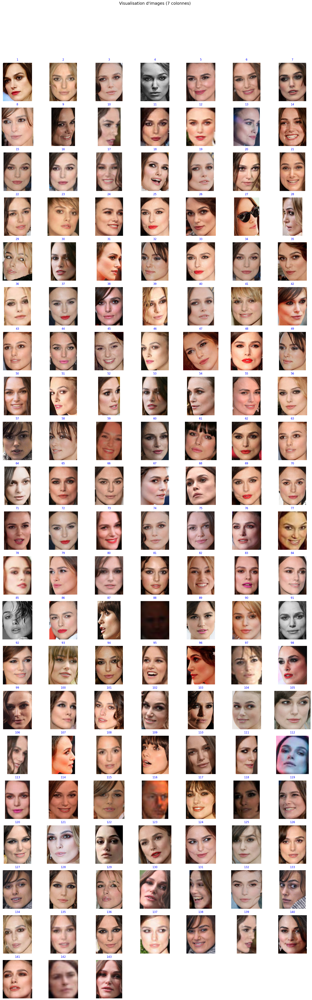


Correspondances entre les numéros et noms des fichiers :
Image 1: Capture d’écran 2021-04-07 à 14.57.54_det.png
Image 2: Capture d’écran 2021-04-07 à 14.56.06_det.png
Image 3: Capture d’écran 2021-04-07 à 14.48.44_det.png
Image 4: Capture d’écran 2021-04-07 à 14.52.43_det.png
Image 5: Capture d’écran 2021-04-07 à 14.42.10_det.png
Image 6: Capture d’écran 2021-04-07 à 14.51.28_det.png
Image 7: Capture d’écran 2021-04-07 à 14.54.41_det.png
Image 8: Capture d’écran 2021-04-07 à 14.50.48_det.png
Image 9: Capture d’écran 2021-04-07 à 14.55.55_det.png
Image 10: Capture d’écran 2021-04-07 à 14.48.27_det.png
Image 11: Capture d’écran 2021-04-07 à 14.48.19_det.png
Image 12: Capture d’écran 2021-04-07 à 14.45.29_det.png
Image 13: Capture d’écran 2021-04-07 à 14.47.17_det.png
Image 14: Capture d’écran 2021-04-07 à 14.43.44_det.png
Image 15: Capture d’écran 2021-04-07 à 14.48.49_det.png
Image 16: Capture d’écran 2021-04-07 à 14.54.02_det.png
Image 17: Capture d’écran 2021-04-07 à 14.41.35_det.png

In [143]:
# visualiser les images
visualize_images("/kaggle/working/detected_faces/train/keira", num_images=143)

### visualisation par paire keira

In [ ]:
# Répertoires d'images d'origine et détectées
original_directory = "/kaggle/input/deeppics/train/keira"
detected_directory = "/kaggle/working/detected_faces/train/keira"

# Nombre de couples d'images à afficher
num_couples_to_display = 143 # Ajustez selon vos besoins

# Visualiser les images originales et détectées
visualize_original_and_detected(original_directory, detected_directory, num_couples=num_couples_to_display)

### correction keira

Traitement de l'image : /kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.49.15.png

0: 512x640 3 FACEs, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)
Visualisez les visages détectés pour sélectionner celui que vous voulez sauvegarder.


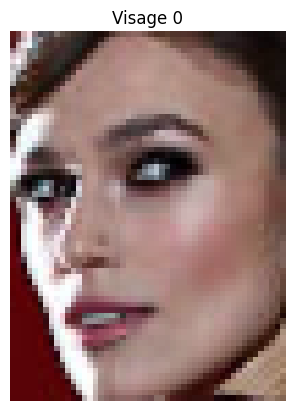

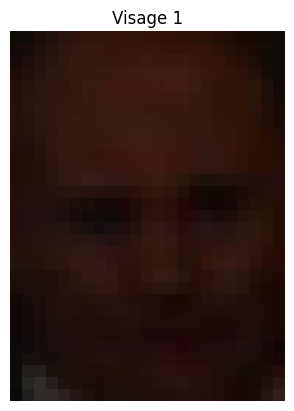

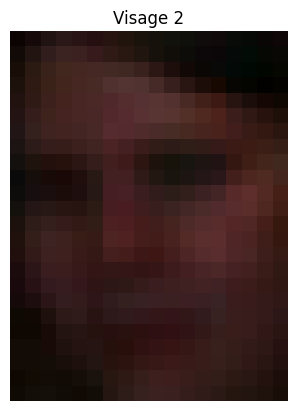

In [144]:
# détection image 20
detect_all_faces_and_select("/kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.49.15.png", "/kaggle/working/detected_faces/doubt/keira", select_index=None)

In [ ]:
# correction image 20
detect_all_faces_and_select("/kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.49.15.png", "/kaggle/working/detected_faces/train/keira", select_index=0)


In [ ]:
# détection image 88
detect_all_faces_and_select("/kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.46.29.png", "/kaggle/working/detected_faces/doubt/keira", select_index=None)

In [ ]:
# Remplacement image 88 
detect_all_faces_and_select("/kaggle/input/deeppics/train/keira/Capture d’écran 2021-04-07 à 14.46.29.png", "/kaggle/working/detected_faces/train/keira", select_index=2)


In [ ]:
import os
import cv2

# Resize
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/train/keira",
    output_dir="/kaggle/working/detected_faces/train/resized/keira",
    target_size=(224, 224)
)

In [ ]:
# Visualiser les images
visualize_images("/kaggle/working/detected_faces/train/resized/keira", num_images=243)

### crop train natalhie

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/train/nathalie")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/train/nathalie"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/train/nathalie"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

In [ ]:
visualize_images("/kaggle/working/detected_faces/train/nathalie", num_images=143)

In [ ]:
import os
import cv2

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/train/nathalie",
    output_dir="/kaggle/working/detected_faces/train/resized/nathalie",
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/train/resized/nathalie", num_images=143)

### crop train others

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/train/others")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/train/others"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/train/others"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

In [ ]:
# visualiser les images
visualize_images("/kaggle/working/detected_faces/train/others", num_images=143)

In [ ]:
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/train/others",
    output_dir="/kaggle/working/detected_faces/train/resized/others",
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/train/resized/others", num_images=143)

### crop val keira 

In [ ]:
# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/val/keira"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/val/keira"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

In [ ]:
# Exemple d'utilisation pour visualiser les images
visualize_images("/kaggle/working/detected_faces/val/keira", num_images=56)

In [ ]:
import os
import cv2
import shutil

shutil.rmtree("/kaggle/working/detected_faces/val/resized/keira")  # Supprime tout le répertoire

resize_with_padding(
    input_dir="/kaggle/working/detected_faces/val/keira",
    output_dir="/kaggle/working/detected_faces/val/resized/keira",
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/val/resized/keira", num_images=56)

### crop val nathalie

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/val/nathalie")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/val/nathalie"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/val/nathalie"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

In [ ]:
visualize_images("/kaggle/working/detected_faces/val/nathalie", num_images=56)

In [ ]:
import os
import cv2

shutil.rmtree("/kaggle/working/detected_faces/val/resized/nathalie")  # Supprime tout le répertoire

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/val/nathalie",
    output_dir="/kaggle/working/detected_faces/val/resized/nathalie",
    #output_dir= "C:/train_seg/keira",  # Répertoire local cible
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/val/resized/nathalie", num_images=56)

### crop val others

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/val/others")  # Supprime tout le répertoire
# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/val/others"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/val/others"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
# process_images_for_best_faces_comb(input_directory, output_directory)
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)

In [ ]:
visualize_images("/kaggle/working/detected_faces/val/others", num_images=56)

In [ ]:
import os
import cv2
import shutil

shutil.rmtree("/kaggle/working/detected_faces/val/resized/others")  # Supprime tout le répertoire

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/val/others",
    output_dir="/kaggle/working/detected_faces/val/resized/others",
    #output_dir= "C:/train_seg/keira",  # Répertoire local cible
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/val/resized/others", num_images=56)

### crop test keira 

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/test/keira")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/test/keira"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/test/keira"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)


In [ ]:
import os
import cv2
import shutil

#shutil.rmtree("/kaggle/working/detected_faces/test/resized/keira")  # Supprime tout le répertoire

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/test/keira",
    output_dir="/kaggle/working/detected_faces/test/resized/keira",
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/test/resized/keira", num_images=56)

### crop test nathalie 

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/test/nathalie")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/test/nathalie"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/test/nathalie"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces_comb(input_directory, output_directory, prob_weight=0.7, area_weight=0.2, center_weight=0.1)


In [ ]:
import os
import cv2
import shutil

shutil.rmtree("/kaggle/working/detected_faces/test/resized/nathalie")  # Supprime tout le répertoire

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/test/nathalie",
    output_dir="/kaggle/working/detected_faces/test/resized/nathalie",
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/test/resized/nathalie", num_images=56)

### crop test others

In [ ]:
import shutil

shutil.rmtree("/kaggle/working/detected_faces/test/others")  # Supprime tout le répertoire

# Répertoires d'entrée et de sortie
input_directory = "/kaggle/input/deeppics/test/others"  # Remplacez par le chemin de l'ensemble d'entraînement
output_directory = "/kaggle/working/detected_faces/test/others"  # Répertoire des visages extraits

# Exécuter la détection sur toutes les images du répertoire
process_images_for_best_faces(input_directory, output_directory)

In [ ]:
import os
import cv2
import shutil

shutil.rmtree("/kaggle/working/detected_faces/test/resized/others")  # Supprime tout le répertoire

# Exemple d'utilisation
resize_with_padding(
    input_dir="/kaggle/working/detected_faces/test/others",
    output_dir="/kaggle/working/detected_faces/test/resized/others",
    #output_dir= "C:/train_seg/keira",  # Répertoire local cible
    target_size=(224, 224)
)

In [ ]:
visualize_images("/kaggle/working/detected_faces/test/resized/others", num_images=56)

# modèle sur photots cropées

In [13]:
import pytorch_lightning as pl
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

class ImageDataModule_resized(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=32):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size

        # Transformations pour l'entraînement
        self.train_transform = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(10),
            transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.02),
            transforms.GaussianBlur(1),  # Flou gaussien léger
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            transforms.RandomErasing(p=0.3, scale=(0.02, 0.1))  # Effacement aléatoire
        ])
        
        # Transformations pour validation et test (pas de transformations aléatoires ici)
        self.val_test_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def setup(self, stage=None):
        train_path = f"{self.data_dir}/train/resized"
        val_path = f"{self.data_dir}/val/resized"
        test_path = f"{self.data_dir}/test/resized"

        self.train_dataset = ImageFolder(root=train_path, transform=self.train_transform)
        self.val_dataset = ImageFolder(root=val_path, transform=self.val_test_transform)
        self.test_dataset = ImageFolder(root=test_path, transform=self.val_test_transform)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=4, pin_memory=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=4, pin_memory=True)


# Création de l'instance du DataModule
data_module_resized = ImageDataModule_resized(data_dir="/kaggle/working/detected_faces", batch_size=32)
data_module_resized.setup()

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR
import timm
import pytorch_lightning as pl
from torchmetrics.classification import Accuracy
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

class ConvNeXtModel_resized(pl.LightningModule):
    def __init__(self, num_classes=3):
        """
        Classifier personnalisé basé sur ConvNeXt Large avec extraction de features.
        Args:
            num_classes: Nombre de classes pour la classification (ici 3).
        """
        super(ConvNeXtModel_resized, self).__init__()

        # Charger ConvNeXt Large pré-entraîné
        self.convnext = timm.create_model(
            'convnext_tiny.in12k_ft_in1k_384',
            #'convnextv2_tiny.fcmae_ft_in22k_in1k_384',
            #'convnext_small.in12k_ft_in1k_384',
            #'convnext_large.fb_in22k_ft_in1k_384', 
            num_classes=num_classes, 
            pretrained=True
        )

        # Geler toutes les couches du modèle (Feature Extraction)
        for param in self.convnext.parameters():
            param.requires_grad = True

        self.convnext.stages[0] = nn.Sequential(
            self.convnext.stages[0],
            nn.Dropout(0.2)
        )
        self.convnext.stages[1] = nn.Sequential(
            self.convnext.stages[1],
            nn.Dropout(0.2)
        )
        self.convnext.stages[2] = nn.Sequential(
            self.convnext.stages[2],
            nn.Dropout(0.6)
        )
        self.convnext.stages[3] = nn.Sequential(
            self.convnext.stages[3],
            nn.Dropout(0.8)
        )
        
        
        self.convnext.head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),  # Pooling pour réduire les dimensions (spatial -> 1x1)
            nn.Flatten(),  # Aplatir pour passer à un vecteur
            nn.Dropout(p=0.8),  # Dropout pour réduire l'overfitting (probabilité = 0.5)
            nn.Linear(self.convnext.num_features, num_classes)
        )

        # Initialiser des métriques de précision
        self.train_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.val_accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.test_accuracy = Accuracy(task="multiclass", num_classes=num_classes)

    def forward(self, x):
        """Passage avant (forward) de l'image dans le modèle."""
        return self.convnext(x)

    def training_step(self, batch, batch_idx):
        """Une étape d'entraînement : calcul des prédictions, de la perte et retour de la perte."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        #self.log("train_loss", loss, on_epoch=True, on_step=False, prog_bar=False)
        acc = self.train_accuracy(y_hat, y)  # Précision
        self.log("train_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        """Une étape de validation : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.val_accuracy(y_hat, y)
        #self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.log("val_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        """Une étape de test : calcul des prédictions, de la perte et des métriques."""
        x, y = batch
        y_hat = self(x)
        loss = nn.CrossEntropyLoss()(y_hat, y)
        acc = self.test_accuracy(y_hat, y)
        #self.log("test_loss", loss, on_epoch=True, on_step=False)
        self.log("test_acc", acc, on_epoch=True, on_step=False, prog_bar=True)
        return loss

    def configure_optimizers(self):
        """
        Configurer l'optimiseur et le scheduler.
        Toutes les couches dégelées seront optimisées.
        """
        # Créer l'optimiseur : inclure toutes les couches dégelées uniquement
        optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, self.parameters()),  # Inclure uniquement les paramètres dégelés
            lr=2e-5,  # Taux d'apprentissage initial
            weight_decay=6e-3  # Régularisation pour éviter l'overfitting
        )
        
        # Scheduler toggle
        use_scheduler = False  
    
        if use_scheduler:
            # Calcul du nombre d'étapes par epoch à partir du DataLoader
            if self.trainer and self.trainer.datamodule:
                train_loader = self.trainer.datamodule.train_dataloader()
                steps_per_epoch = len(train_loader)
            else:
                steps_per_epoch = 100  # Valeur par défaut si le DataLoader n'est pas défini
                print("⚠️ Warning : 'trainer' ou 'datamodule' non défini, steps_per_epoch par défaut utilisé.")
            
            # Scheduler OneCycleLR
            scheduler = optim.lr_scheduler.OneCycleLR(
                optimizer,
                max_lr=5e-5,  # Taux d'apprentissage maximal
                steps_per_epoch=steps_per_epoch,
                epochs=self.trainer.max_epochs if self.trainer else 10
            )
            
            # Retourner l'optimiseur et le scheduler
            return {"optimizer": optimizer, "lr_scheduler": {"scheduler": scheduler, "interval": "step"}}
        else:
            # Retourner uniquement l'optimiseur si le scheduler est désactivé
            return {"optimizer": optimizer}

# Logger pour enregistrer les métriques
csv_logger = CSVLogger(
    save_dir="logs",
    name="ConvNeXtModel_resized",
    version="ConvNeXtModel_resized"
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_acc",
    mode="max",
    save_top_k=1,  # Sauvegarde uniquement le meilleur modèle
    dirpath="checkpoints/",  # Dossier pour enregistrer les checkpoints
    filename="best_model-{epoch:02d}-{val_acc:.2f}"
)

# Initialiser le modèle
model_ConvNeXtModel_resized = ConvNeXtModel_resized(num_classes=3)

## *Trainer* modèle ConvNeXtModel_resized

In [15]:
from pytorch_lightning import Trainer

# Configurer le Trainer avec callbacks
trainer = Trainer(
    max_epochs=20,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    callbacks=[checkpoint_callback],
    logger=csv_logger,
    enable_progress_bar=True,
    enable_model_summary=True,
    check_val_every_n_epoch=1,
    val_check_interval=1.0
)

# Entraîner le modèle
trainer.fit(model_ConvNeXtModel_resized, datamodule=data_module_resized)

# Tester le modèle
trainer.test(model_ConvNeXtModel_resized, datamodule=data_module_resized)

In [ ]:
best_model = ConvNeXtModel_resized.load_from_checkpoint(checkpoint_callback.best_model_path)

trainer.test(best_model, datamodule=data_module_resized)

## *Log* modèle ConvNeXtModel_resized

In [ ]:
import pandas as pd
from tabulate import tabulate

# Chemin vers le fichier CSV
log_path = "logs/ConvNeXtModel_resized/ConvNeXtModel_resized/metrics.csv"

# Lire le fichier CSV
df = pd.read_csv(log_path)

# Afficher les premières lignes
df.style.format("{:.2f}")  # Pour formater les nombres

## Sauvegarde meilleur modèle ConvNeXtModel_resized

In [ ]:
# Sauvegarde meilleur modèle

# import shutil
# shutil.copy(checkpoint_callback.best_model_path, "/kaggle/working/best_best_model.ckpt")

In [16]:
# Importer meilleur modèle

best_best_model_copy = ConvNeXtModel_resized.load_from_checkpoint("/kaggle/working/best_best_model.ckpt")
trainer.test(best_best_model_copy, datamodule=data_module_resized)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9642857313156128     │
└───────────────────────────┴───────────────────────────┘

[{'test_acc': 0.9642857313156128}]